In [ ]:
# Darknet Yolo v5 detection pipeline


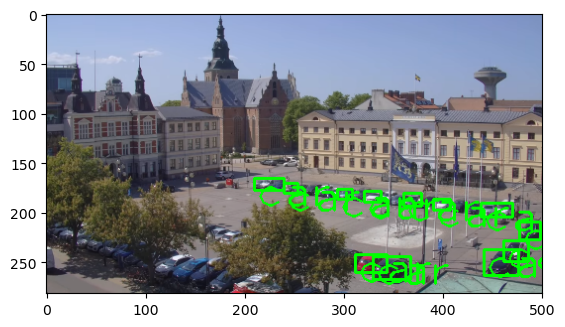

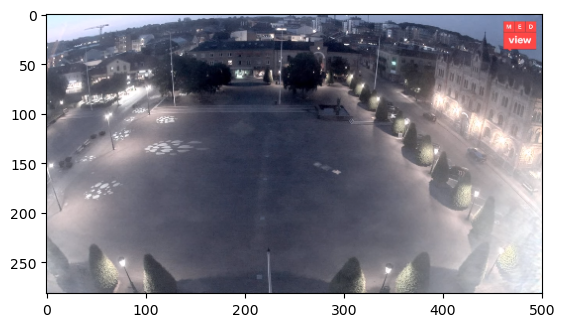

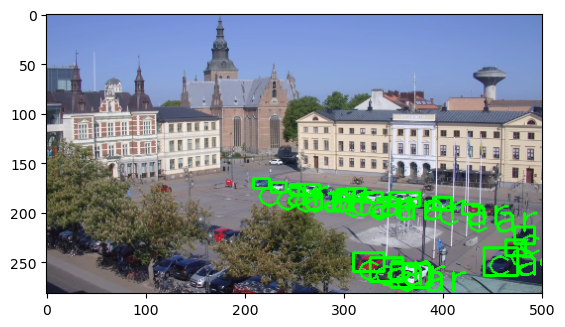

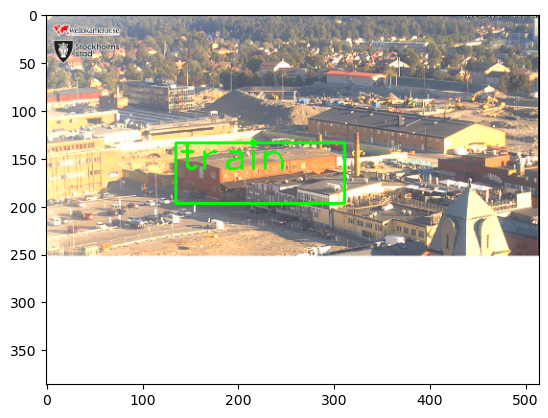

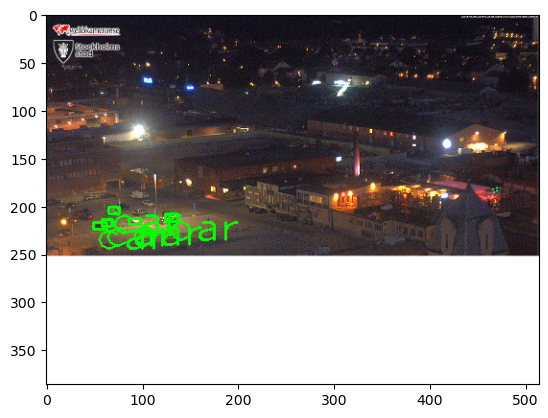

...

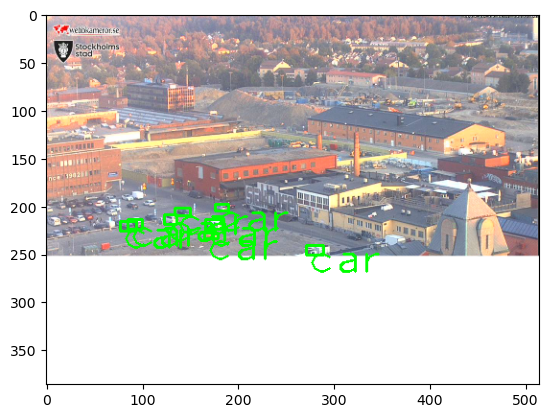

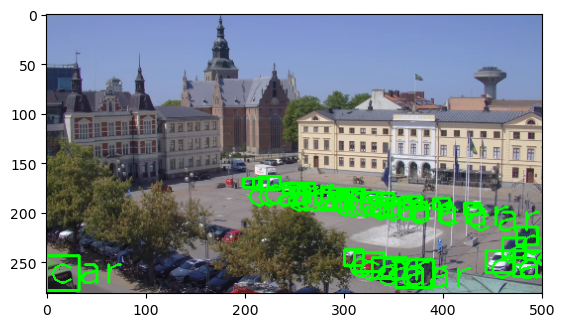

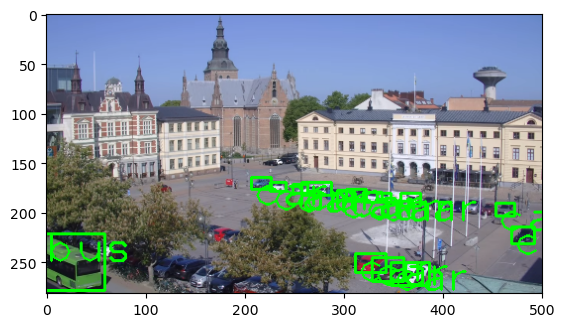

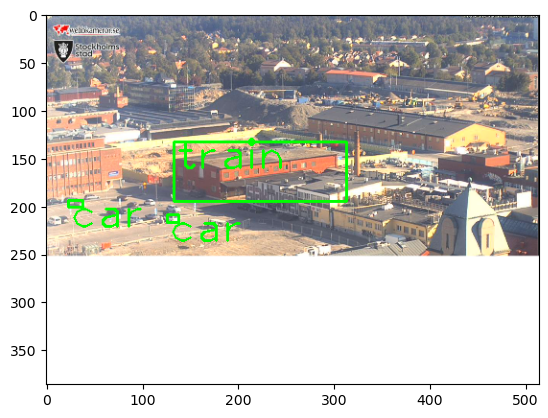

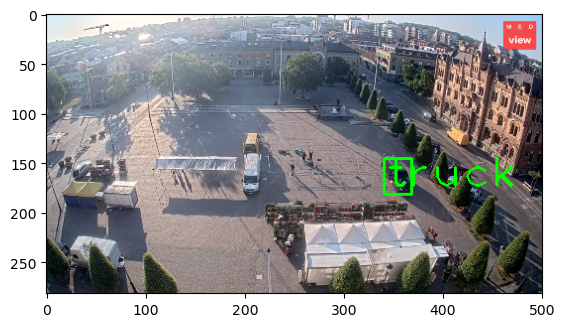

                                             Filename          Class Count
0   /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            car    12
1   /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            car    16
2   /home/sf_afn/Insync/sofiaa720@gmail.com/Google...          train     1
3   /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            car     5
4   /home/sf_afn/Insync/sofiaa720@gmail.com/Google...  traffic light     2
..                                                ...            ...   ...
57  /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            bus     1
58  /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            car    14
59  /home/sf_afn/Insync/sofiaa720@gmail.com/Google...          train     1
60  /home/sf_afn/Insync/sofiaa720@gmail.com/Google...            car     2
61  /home/sf_afn/Insync/sofiaa720@gmail.com/Google...          truck     1

[62 rows x 3 columns]


In [8]:
import cv2
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt


def yolo_object_detection(image_folder):
    # Load YOLO
    model_config = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/yolov3.cfg"
    model_weights = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/yolov3.weights"
    net = cv2.dnn.readNet(model_weights, model_config)
    output_layers = net.getUnconnectedOutLayersNames()

    # Load names of classes
    classes = None
    with open(
        "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/darknet/cfg/coco.names",
        "r",
    ) as f:
        classes = [line.strip() for line in f.readlines()]

    # Initialize DataFrame to store results
    df = pd.DataFrame(columns=["Filename", "Class", "Count"])

    # Get list of all image paths in the folder
    image_paths = [
        os.path.join(image_folder, f)
        for f in os.listdir(image_folder)
        if os.path.isfile(os.path.join(image_folder, f))
    ]

    for image_path in image_paths:
        # Load image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error loading image: {image_path}")
            continue

        img = cv2.resize(img, None, fx=0.4, fy=0.4)
        height, width, channels = img.shape

        # Detecting objects
        blob = cv2.dnn.blobFromImage(
            img, 0.00392, (416, 416), (0, 0, 0), True, crop=False
        )
        net.setInput(blob)
        outs = net.forward(output_layers)

        # Showing informations on the screen
        class_ids = []
        confidences = []
        boxes = []
        for out in outs:
            for detection in out:
                scores = detection[5:]
                class_id = np.argmax(scores)
                confidence = scores[class_id]
                if confidence > 0.5:
                    # Object detected
                    center_x = int(detection[0] * width)
                    center_y = int(detection[1] * height)
                    w = int(detection[2] * width)
                    h = int(detection[3] * height)

                    # Rectangle coordinates
                    x = int(center_x - w / 2)
                    y = int(center_y - h / 2)

                    boxes.append([x, y, w, h])
                    confidences.append(float(confidence))
                    class_ids.append(class_id)

        indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

        # Count the occurrences of each class
        class_counts = dict()
        for i in range(len(boxes)):
            if i in indexes:
                class_name = str(classes[class_ids[i]])
                if class_name in class_counts:
                    class_counts[class_name] += 1
                else:
                    class_counts[class_name] = 1

        # Add to DataFrame
        for class_name, count in class_counts.items():
            df_temp = pd.DataFrame(
                {"Filename": [image_path], "Class": [class_name], "Count": [count]}
            )
            df = pd.concat([df, df_temp], ignore_index=True)

        # Uncomment the following lines to see the detection results on a particular image
        for i in range(len(boxes)):
            if i in indexes:
                x, y, w, h = boxes[i]
                label = str(classes[class_ids[i]])
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(
                    img, label, (x, y + 30), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 2
                )

        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()

    return df


image_folder = "/home/sf_afn/Insync/sofiaa720@gmail.com/Google Drive/masters_thesis/code_v1/msc_parking/univrses/data/screenshot_samples/"
df = yolo_object_detection(image_folder)
print(df)

In [3]:
df


NameError: name 'df' is not defined

In [2]:
from datetime import datetime


def extract_timestamp(file_name):
    # Extract the date and time parts from the string
    day = file_name.split("-")[0][5:7]
    month = file_name.split("-")[0][7:9]
    year = "2023"
    hour = file_name.split("-")[1][:2]
    minute = file_name.split("-")[1][2:4]

    # Combine the parts into a string that represents the timestamp
    timestamp_str = f"{day}/{month}/{year} {hour}:{minute}"

    # Convert the string to a datetime object
    timestamp = datetime.strptime(timestamp_str, "%d/%m/%Y %H:%M")

    return timestamp


# Apply the function to the 'File Name' column
df["timestamp_true"] = df["File_name"].apply(extract_timestamp)
# data_df['timestamp_true'] = pd.to_datetime(data_df['timestamp_true'])

NameError: name 'df' is not defined